# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

# 1. Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

### Determine Business Objetives
- **Background:**
Our context revolves around aiding a group of used car dealerships in refining their inventory selection and adjustment. We aim to analyze historical data of used car sales to identify pivotal factors that influence vehicle prices.
- **Business Objectives:**
Our objective is to develop predictive models capable of accurately estimating prices of used cars based on their attributes. These models will empower dealerships to make well-informed decisions regarding pricing and vehicle selection for their inventory.
- **Business Success Criteria:**
We will deem the project successful if we succeed in constructing regression models that exhibit high predictive performance, as indicated by precision in estimating used car prices. Additionally, we will deliver valuable insights into the primary drivers of used car prices.

### Assessment of Situation:
- **Resources and Constraints:** While we possess a historical dataset of used car sales, we need to acknowledge limitations in computational resources and personnel.
- **Risks and Contingencies:** The dataset might contain noise and outliers, potentially impacting model quality. We will implement data cleaning and manipulation techniques to mitigate these risks.
- **Terminology:** We will employ technical terms such as "regression," "predictor variables," and "model training" to effectively convey our methodologies and findings.
- **Costs and Benefits:** The costs of model implementation and the investment of time in data cleaning and preparation must be justified by the anticipated benefits in dealerships' more informed decision-making.

### Determine Data Mining Goals:
- **Data Mining Objectives:** Our primary goal is to develop regression models for predicting used car prices.
- **Data Mining Success Criteria:** We will consider our efforts successful if our models exhibit strong performance, as evidenced by evaluation metrics like mean squared error (MSE) and coefficient of determination (R²).

### Produce Project Plan:
- **Project Plan:** Our plan will encompass phases involving data preparation, model selection and construction, performance assessment, and the presentation of outcomes to dealerships.
- **Initial Data Collection Tools and Techniques:** We will leverage pandas and scikit-learn for data analysis and modeling. Our initial steps will involve gathering and exploring the historical dataset of used car sales.

# 2. Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

### Step 1: Load the Dataset and Initial Visualization

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, OneHotEncoder
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.compose import make_column_transformer, TransformedTargetRegressor
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SequentialFeatureSelector,SelectFromModel
from sklearn.metrics import mean_squared_error
import plotly.express as px
from geopy.geocoders import Nominatim
import warnings

# Ignore all warning messages
warnings.filterwarnings("ignore")

# Load the dataset
df = pd.read_csv('data/vehicles.csv', index_col= 'id')

# Display 10 random samples
df.sample(10)

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
id,,,,,,,,,,,,,,,,,
7312789151,orlando,3350,2005.0,hyundai,tucson gls,excellent,6 cylinders,gas,148000.0,clean,automatic,NaN,4wd,NaN,SUV,black,fl
7310228338,redding,25990,2013.0,bmw,x6 xdrive35i sport utility,good,NaN,gas,52145.0,clean,automatic,5UXFG2C59DL786683,NaN,NaN,SUV,black,ca
7316218341,SF bay area,451,2018.0,jeep,wrangler unlimited sahara,NaN,6 cylinders,gas,36920.0,clean,automatic,1C4HJXEG1JW231793,4wd,NaN,convertible,NaN,ca
7316033055,phoenix,9988,2015.0,chrysler,200,NaN,NaN,gas,93986.0,clean,automatic,1C3CCCAB1FN704603,fwd,NaN,sedan,NaN,az
7316474537,"washington, DC",5300,2009.0,NaN,hummer h3,NaN,NaN,gas,173000.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,dc
7308007342,hudson valley,6000,1975.0,pontiac,firebird,fair,8 cylinders,gas,3000.0,clean,automatic,NaN,rwd,NaN,NaN,NaN,ny
7304452227,medford-ashland,11500,2018.0,ford,fiesta se 4dr sedan,NaN,NaN,gas,20208.0,clean,automatic,3FADP4BJXJM143164,NaN,NaN,NaN,NaN,or
7314840641,yakima,0,2015.0,gmc,sierra 2500,NaN,8 cylinders,diesel,152940.0,clean,automatic,1GT12YE82FF515843,4wd,NaN,truck,NaN,wa
7315344835,minneapolis / st paul,3600,2000.0,chevrolet,cavalier z24,good,4 cylinders,gas,67800.0,clean,automatic,NaN,fwd,NaN,convertible,silver,mn


### Step 2: Dataset Information and Description

In [17]:
# Display information about columns, number of records and data types.
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426880 entries, 7222695916 to 7301591129
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   region        426880 non-null  object 
 1   price         426880 non-null  int64  
 2   year          425675 non-null  float64
 3   manufacturer  409234 non-null  object 
 4   model         421603 non-null  object 
 5   condition     252776 non-null  object 
 6   cylinders     249202 non-null  object 
 7   fuel          423867 non-null  object 
 8   odometer      422480 non-null  float64
 9   title_status  418638 non-null  object 
 10  transmission  424324 non-null  object 
 11  VIN           265838 non-null  object 
 12  drive         296313 non-null  object 
 13  size          120519 non-null  object 
 14  type          334022 non-null  object 
 15  paint_color   296677 non-null  object 
 16  state         426880 non-null  object 
dtypes: float64(2), int64(1), object(14)

According to the dataset and my own interpretation, the columns describe the following:

- **id:** A unique identifier for each entry in the dataset.
- **region:** The geographical region where the seller is located or where the vehicle was advertised.
- **price:** The price of the vehicle as listed in the advertisement.
- **manufacturer:** The manufacturer of the vehicle.
- **model:** The model of the vehicle.
- **condition:** The overall condition of the vehicle (used, new, etc.).
- **cylinders:** The number of cylinders in the vehicle's engine.
- **fuel:** The type of fuel used by the vehicle (gasoline, diesel, electric, etc.).
- **odometer:** The mileage driven by the vehicle.
- **title_status:** The title status of the vehicle (clean, salvage, etc.).
    - **Clean:** Indicates that the vehicle title is clean, meaning there are no significant legal issues associated with the vehicle. It has not suffered major damages or problems that affect its legal ownership.
    - **Rebuilt:** Indicates that the vehicle has had significant damage in the past but has been repaired and restored to an operational state. Generally, this implies that the vehicle was declared a total loss at some point and then rebuilt.
    - **Lien:** A lien is a legal right that another entity, such as a lender or creditor, has over the vehicle due to an outstanding debt. If a vehicle has a lien, it means it cannot be sold without resolving the associated debt.
    - **Salvage:** Indicates that the vehicle has been declared salvage due to severe damage. This means that the repair costs exceeded the vehicle's value prior to the damage. Salvaged vehicles are often repaired, but it's important to consider their history.
    - **Missing:** Indicates that the vehicle title is missing or cannot be located. This can be problematic when attempting to sell or transfer ownership of the vehicle.
- **transmission:** The type of transmission in the vehicle (automatic, manual, etc.).
- **VIN:** Vehicle Identification Number, a unique code for each vehicle.
- **drive:** The type of drive system in the vehicle (front-wheel drive, rear-wheel drive, 4x4, etc.).
- **size:** The size category of the vehicle.
- **type:** The type of vehicle (sedan, truck, SUV, etc.).
- **paint_color:** The color of the vehicle's paint.
- **state:** The state or province where the seller is located or where the vehicle was advertised.

### Step 3: Descriptive Statistics

In [18]:
# Display descriptive statistics of the numeric columns
df.describe()

,price,year,odometer
count,4.268800e+05,425675.000000,4.224800e+05
mean,7.519903e+04,2011.235191,9.804333e+04
std,1.218228e+07,9.452120,2.138815e+05
min,0.000000e+00,1900.000000,0.000000e+00
25%,5.900000e+03,2008.000000,3.770400e+04
50%,1.395000e+04,2013.000000,8.554800e+04
75%,2.648575e+04,2017.000000,1.335425e+05
max,3.736929e+09,2022.000000,1.000000e+07


### Step 4: Identify Null Values

In [19]:
# Check for missing values in the dataset
print("Count of Null Values:")
df.isnull().sum()

Count of Null Values:


region               0
price                0
year              1205
manufacturer     17646
model             5277
condition       174104
cylinders       177678
fuel              3013
odometer          4400
title_status      8242
transmission      2556
VIN             161042
drive           130567
size            306361
type             92858
paint_color     130203
state                0
dtype: int64

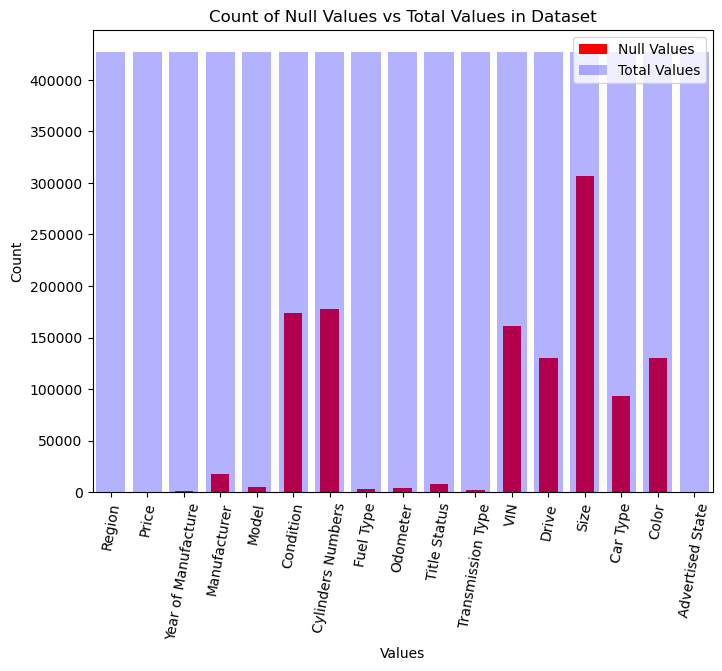

In [20]:
# Visualize the amount of missing data
null_counts = df.isnull().sum()
total_counts = df.shape[0]

# Custom labels for the columns
custom_labels = {
    'region': 'Region',
    'price': 'Price',
    'year': 'Year of Manufacture',
    'manufacturer': 'Manufacturer',
    'model': 'Model',
    'condition': 'Condition',
    'cylinders': 'Cylinders Numbers',
    'fuel': 'Fuel Type',
    'odometer': 'Odometer',
    'title_status': 'Title Status',
    'transmission': 'Transmission Type',
    'VIN': 'VIN',
    'drive': 'Drive',
    'size': 'Size',
    'type': 'Car Type',
    'paint_color': 'Color',
    'state': 'Advertised State'
}

plt.figure(figsize=(8, 6))
null_counts.plot(kind='bar', color='red', label='Null Values')
plt.bar(null_counts.index, total_counts, color='blue', alpha=0.3, label='Total Values')
plt.title('Count of Null Values vs Total Values in Dataset')
plt.xlabel('Values')
plt.ylabel('Count')
plt.xticks(range(len(custom_labels)), [custom_labels[col] for col in null_counts.index], rotation=80)
plt.legend()
plt.show()

### Step 5: Identify Unique

In [21]:
# Display the number of unique values in each column
print("Count of Unique Values:")
df.nunique()

Count of Unique Values:


region             404
price            15655
year               114
manufacturer        42
model            29649
condition            6
cylinders            8
fuel                 5
odometer        104870
title_status         6
transmission         3
VIN             118246
drive                3
size                 4
type                13
paint_color         12
state               51
dtype: int64

### Step 6: Duplicate Values

In [22]:
# It's shown how many duplicated VIN records exist
duplicates = df[df['VIN'].duplicated()]
print("Duplicate Rows")
df.duplicated().sum()

Duplicate Rows


56202

### Step 7: Preliminary Visualization
Here, we will take an initial look at the distribution of price data and the relationship between the car's manufacturing years and the price.

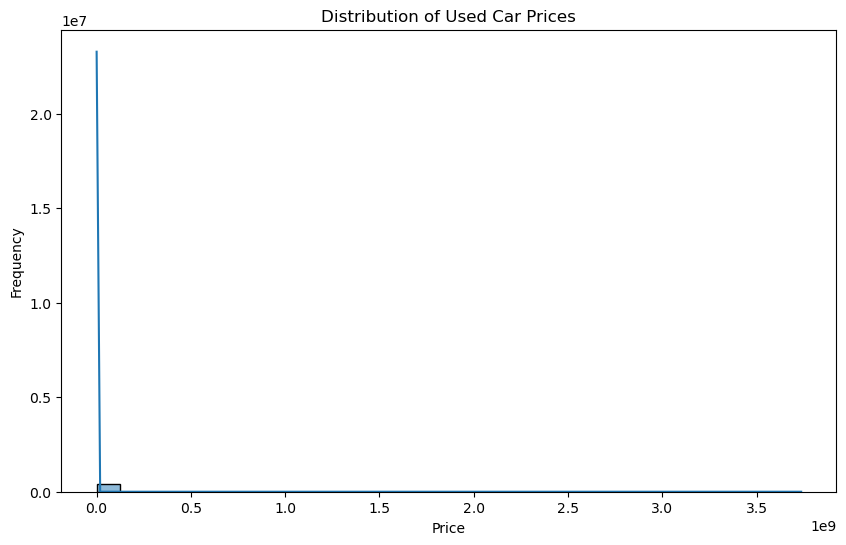

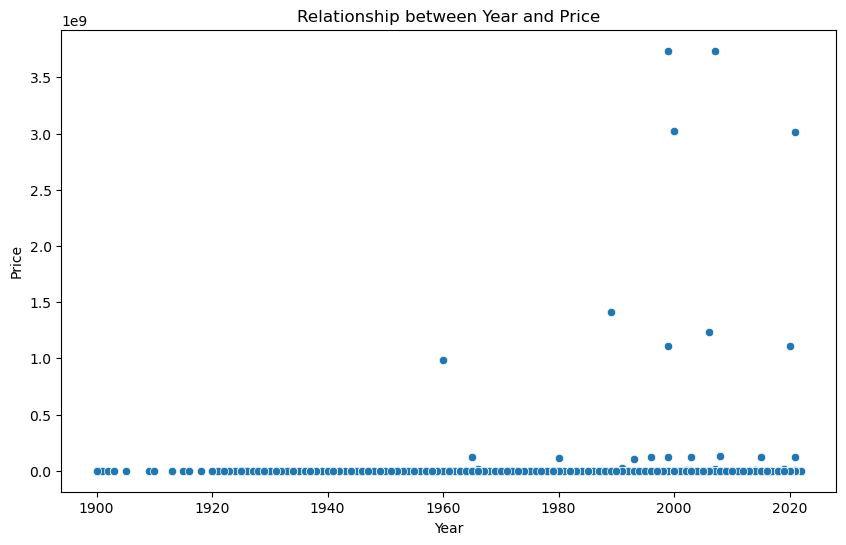

In [23]:
# Visualize the distribution of prices
plt.figure(figsize=(10, 6))
sns.histplot(df['price'], bins=30, kde=True)
plt.title('Distribution of Used Car Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

# Visualize the relationship between year and price
plt.figure(figsize=(10, 6))
sns.scatterplot(x='year', y='price', data=df)
plt.title('Relationship between Year and Price')
plt.xlabel('Year')
plt.ylabel('Price')
plt.show()

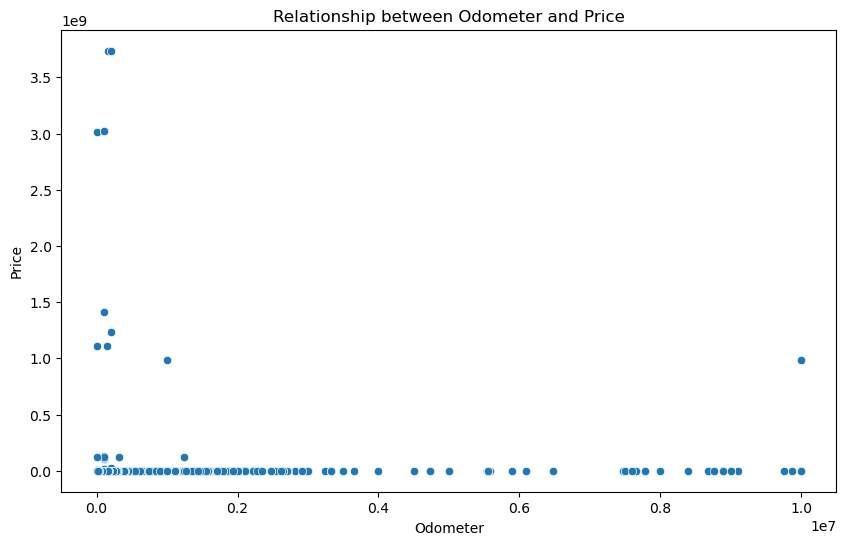

In [24]:
# Visualize the relationship between Odometer and price
plt.figure(figsize=(10, 6))
sns.scatterplot(x='odometer', y='price', data=df)
plt.title('Relationship between Odometer and Price')
plt.xlabel('Odometer')
plt.ylabel('Price')
plt.show()

### Conclusions from section:
1. There are two different attributes that could be used as unique identifiers: 'ID' and 'VIN'. However, the 'VIN' value has several duplicate and null values to be considered reliable.
2. There is a significant amount of missing data in several columns, ranging from 25% to 50% of missing values. The column with the highest data loss is 'size'.
3. Certain columns seem unimportant: 'size' (due to having less than 50% of data), 'model', 'VIN' (considering the observations in conclusion 1), condition, drive and 'paint_color'.
4. There are several extremely high and extremely low price values (assuming cars are almost free, which doesn't make sense).

# 3. Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

### Step 1: Removing Less Relevant Columns

In [25]:
# Remove the columns that exhibit the most inconsistencies or do not affect the price.
columns_to_remove = ['VIN', 'size', 'model', 'paint_color', 'condition', 'drive']
df_cleaned = df.drop(columns=columns_to_remove)

### Step 2: Handling Missing Values
In this step, we will address the missing values in the dataset. Missing values can have a significant impact on analysis and modeling results. There are several strategies we can use to handle missing values, such as removing rows or columns with missing values, imputing missing values with reasonable estimates, or using more advanced techniques.

Since the "price" column is the target variable and crucial for our analysis, we cannot remove rows with missing values in this column. However, we could impute missing values in other numeric columns using the median, as the median is less sensitive to outliers compared to the mean.

In [26]:
#Imputing missing values with default values like 'other'.
df_cleaned['cylinders'] = df_cleaned['cylinders'].fillna('other')
df_cleaned['type'] = df_cleaned['type'].fillna('other')

In [27]:
# Remove rows with missing values
df_cleaned = df_cleaned.dropna(subset=['year','fuel','odometer','transmission','manufacturer','title_status'])

In [28]:
# Display the number of missing values after handling
missing_values_after = df_cleaned.isnull().sum()
print('Number of Missing')
missing_values_after

Number of Missing


region          0
price           0
year            0
manufacturer    0
cylinders       0
fuel            0
odometer        0
title_status    0
transmission    0
type            0
state           0
dtype: int64

### Step 3: Handling Values Types

There is a significant number of columns with data type "object." To handle them properly, these data are converted to string format.

In [29]:
# Data types before
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 394751 entries, 7316814884 to 7301591129
Data columns (total 11 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   region        394751 non-null  object 
 1   price         394751 non-null  int64  
 2   year          394751 non-null  float64
 3   manufacturer  394751 non-null  object 
 4   cylinders     394751 non-null  object 
 5   fuel          394751 non-null  object 
 6   odometer      394751 non-null  float64
 7   title_status  394751 non-null  object 
 8   transmission  394751 non-null  object 
 9   type          394751 non-null  object 
 10  state         394751 non-null  object 
dtypes: float64(2), int64(1), object(8)
memory usage: 36.1+ MB


In [30]:
# Convert object data types to strings
df_cleaned = df_cleaned.convert_dtypes()

# Data types after
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 394751 entries, 7316814884 to 7301591129
Data columns (total 11 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   region        394751 non-null  string
 1   price         394751 non-null  Int64 
 2   year          394751 non-null  Int64 
 3   manufacturer  394751 non-null  string
 4   cylinders     394751 non-null  string
 5   fuel          394751 non-null  string
 6   odometer      394751 non-null  Int64 
 7   title_status  394751 non-null  string
 8   transmission  394751 non-null  string
 9   type          394751 non-null  string
 10  state         394751 non-null  string
dtypes: Int64(3), string(8)
memory usage: 37.3 MB


### Step 4: Scaling Numeric Features
In this stage, we will scale the numeric features to ensure that they are all on the same scale.

In [31]:
# List of numeric columns to scale
num_cols = ['year', 'odometer']

# CCreate a StandardScaler object
scaler = StandardScaler()
df_scaled = df_cleaned.copy()

# Scale numeric features
df_scaled['year'] = pd.DataFrame(scaler.fit_transform(df_cleaned[num_cols]), columns=num_cols)['year'].values
df_scaled['odometer'] = pd.DataFrame(scaler.fit_transform(df_cleaned[num_cols]), columns=num_cols)['odometer'].values

# Display the first rows of the scaled dataset
df_scaled.head()

,region,price,year,manufacturer,cylinders,fuel,odometer,title_status,transmission,type,state
id,,,,,,,,,,,
7316814884,auburn,33590,0.282713,gmc,8 cylinders,gas,-0.193014,clean,other,pickup,al
7316814758,auburn,22590,-0.161068,chevrolet,8 cylinders,gas,-0.127245,clean,other,pickup,al
7316814989,auburn,39590,0.948386,chevrolet,8 cylinders,gas,-0.384613,clean,other,pickup,al
7316743432,auburn,30990,0.615550,toyota,8 cylinders,gas,-0.276049,clean,other,pickup,al
7316356412,auburn,15000,0.171768,ford,6 cylinders,gas,0.153364,clean,automatic,truck,al


### Step 5: Categorical Variables Encoding
In this stage, we will encode categorical variables using the one-hot encoding technique. One-hot encoding allows us to convert categorical variables into a numerical representation that can be used by modeling algorithms.

In [32]:
# List of categorical columns to encode
categorical_cols = ['manufacturer', 'cylinders', 'fuel',
                    'title_status', 'transmission', 'type', 'state']

features_data = pd.DataFrame(df_scaled[categorical_cols])

# Encode categorical variables using one-hot encoding
features_data_encoded = pd.get_dummies(features_data, columns=categorical_cols, drop_first=True)

# Concatenate the dummies table with model data
df_encoded_no_num =pd.concat([df_scaled[['price','year','odometer']], features_data_encoded], axis = 1)

# Concatenate the dummies table full data set
df_encoded =pd.concat([df_scaled, features_data_encoded], axis = 1)

# Display the first few rows of the encoded dataset
df_encoded.head()

,region,price,year,manufacturer,cylinders,fuel,odometer,title_status,transmission,type,...,state_sd,state_tn,state_tx,state_ut,state_va,state_vt,state_wa,state_wi,state_wv,state_wy
id,,,,,,,,,,,,,,,,,,,,,
7316814884,auburn,33590,0.282713,gmc,8 cylinders,gas,-0.193014,clean,other,pickup,...,0,0,0,0,0,0,0,0,0,0
7316814758,auburn,22590,-0.161068,chevrolet,8 cylinders,gas,-0.127245,clean,other,pickup,...,0,0,0,0,0,0,0,0,0,0
7316814989,auburn,39590,0.948386,chevrolet,8 cylinders,gas,-0.384613,clean,other,pickup,...,0,0,0,0,0,0,0,0,0,0
7316743432,auburn,30990,0.615550,toyota,8 cylinders,gas,-0.276049,clean,other,pickup,...,0,0,0,0,0,0,0,0,0,0
7316356412,auburn,15000,0.171768,ford,6 cylinders,gas,0.153364,clean,automatic,truck,...,0,0,0,0,0,0,0,0,0,0


In [33]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 394751 entries, 7316814884 to 7301591129
Columns: 132 entries, region to state_wy
dtypes: Int64(1), float64(2), string(8), uint8(121)
memory usage: 82.1 MB


### Step 6: Removing outliers.
There are several values outside the typical range in the price data, either extremely high or extremely low values that would only introduce noise in our dataset.

In [34]:
# Look at how many price data points are above $200,000.
print('Price data above $200,000')
len(df_encoded[df_encoded['price'] > 200000])

Price data above $200,000


86

In [35]:
# Look at how many price data points are below $10."
print('Price data below $10')
len(df_encoded[df_encoded['price'] < 10])

Price data below $10


30897

In [36]:
# Removing the outlier data.
df_encoded['price'] = df_encoded['price'].astype('int64')
df_prepared = df_encoded.query('price < 200000 and price > 10')

df_encoded_no_num['price'] = df_encoded_no_num['price'].astype('int64')
df_prepared_no_num = df_encoded_no_num.query('price < 200000 and price > 10')

### Step 7: We compare the sizes of the initial and final datasets.

In [37]:
# Initial dataset
df.shape

(426880, 17)

In [38]:
# Prepared dataset
df_prepared.shape

(363744, 132)

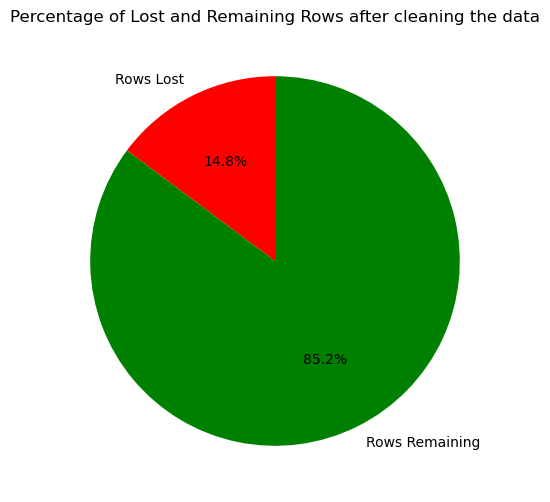

In [39]:
# Number of rows in the original and prepared datasets
total_rows_initial = df.shape[0]
total_rows_prepared = df_prepared.shape[0]

# Calculate the number of rows lost and remaining
rows_lost = total_rows_initial - total_rows_prepared
rows_remaining = total_rows_prepared

# Labels for the pie chart
labels = ['Rows Lost', 'Rows Remaining']

# Values for the pie chart
values = [rows_lost, rows_remaining]

# Create the pie chart
plt.figure(figsize=(6, 6))
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90, colors=['red', 'green'])
plt.title('Percentage of Lost and Remaining Rows after cleaning the data')
plt.show()


### Step 8: Check new views 

#### Skewed Distribution

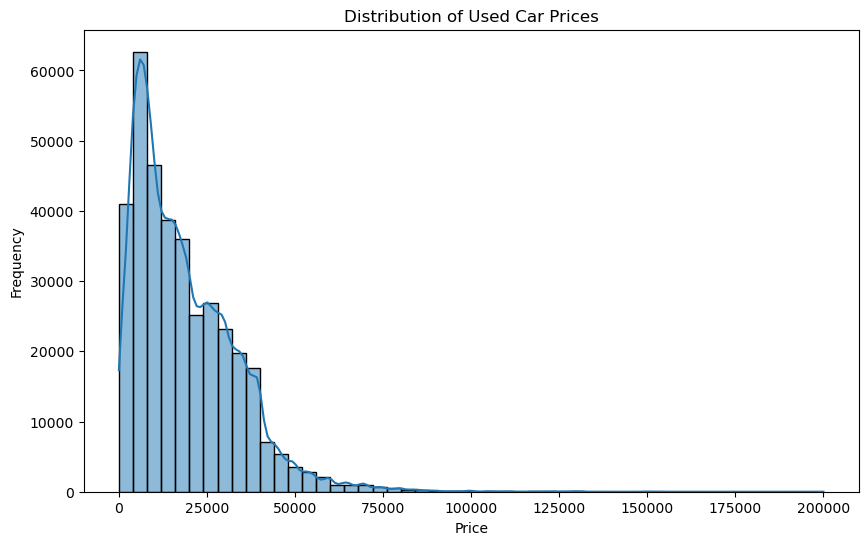

In [40]:
# Visualize the distribution of prices
plt.figure(figsize=(10, 6))
sns.histplot(df_prepared['price'], bins=50, kde=True)
plt.title('Distribution of Used Car Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

#### Scatterplot Manufacturing Year vs Price

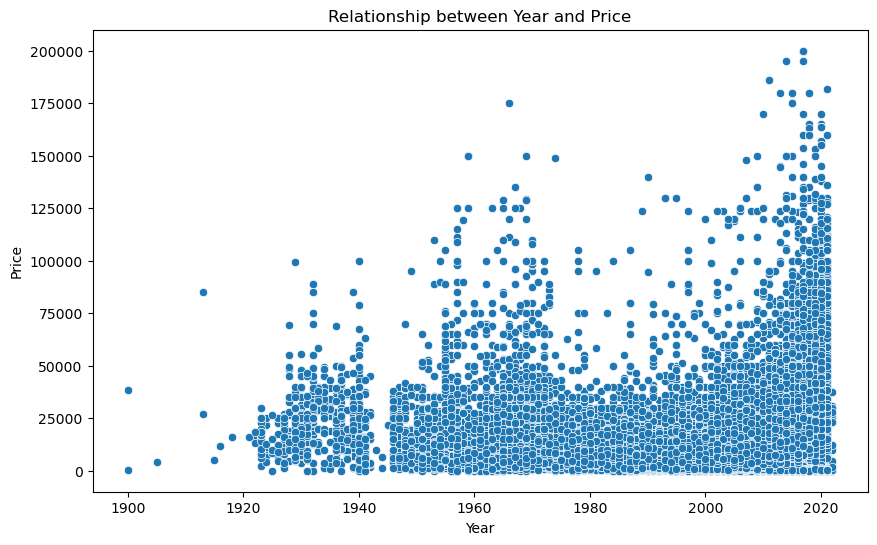

In [41]:
# Visualize the relationship between year and price
data = df_cleaned.copy()
data['price'] = df_cleaned['price'] = df_cleaned['price'].astype('int64')
plt.figure(figsize=(10, 6))
sns.scatterplot(x='year', y='price', data=data.query('price < 200000 and price > 10'))
plt.title('Relationship between Year and Price')
plt.xlabel('Year')
plt.ylabel('Price')
plt.show()

#### Scatterplot Odometer vs Price

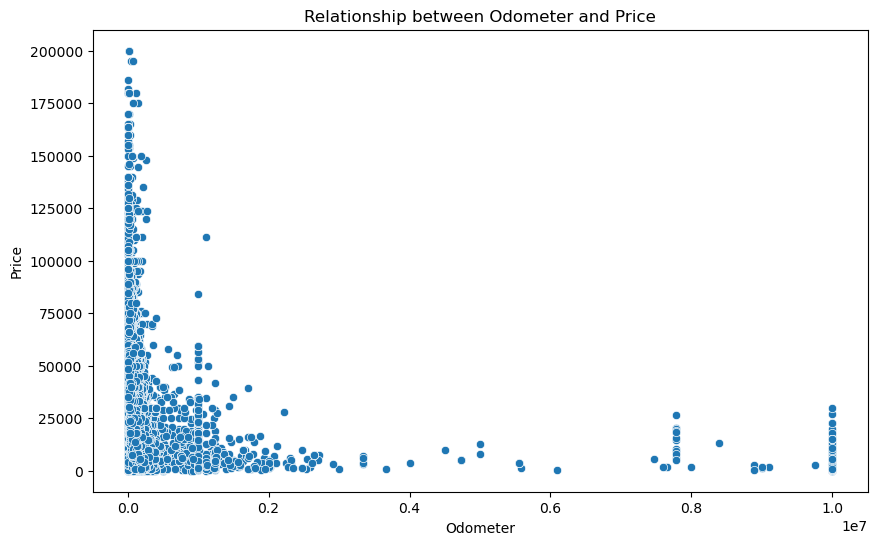

In [42]:
# Visualize the relationship between odometer and price
plt.figure(figsize=(10, 6))
sns.scatterplot(x='odometer', y='price', data=data.query('price < 200000 and price > 10'))
plt.title('Relationship between Odometer and Price')
plt.xlabel('Odometer')
plt.ylabel('Price')
plt.show()

#### View manufacturer

In [43]:
# Group data by manufacturer
mean_price_manuf = df_prepared.groupby("manufacturer")[["price"]].mean().reset_index()

# Create a histogram of number of interviews vs Occupation
px.histogram(mean_price_manuf.sort_values("price"), x="manufacturer",y="price",barmode='group',
             title="Average Price by Manufacturer", labels={"manufacturer":"Manufacturer"})

In [44]:
# Create a pie chart
fig = px.pie(df_prepared, names='manufacturer', title='Distribution of Cars by Manufacturer')

# Display the chart
fig.show()

#### View region

In [83]:
# Dataset is created with the number of cars per region
df_map = pd.DataFrame({'region':df_prepared['region'].unique(), 'count':df_prepared.groupby('region').count().values[:,0]})

In [109]:
# Geocoding using Nominatim
geolocator = Nominatim(user_agent="my_geocoder")

def get_coordinates(location):
    try:
        location = geolocator.geocode(location + ", USA")
        return location.latitude, location.longitude
    except:
        return None
df_map['coordinates'] = df_map['region'].apply(get_coordinates)
df_map[['latitude', 'longitude']] = df_map['coordinates'].apply(lambda x: pd.Series(x))

# Create an interactive map
fig = px.scatter_geo(df_map, lat=df_map['latitude'], lon=df_map['longitude'],
                     title='Ubicación de Regiones en USA', size="count",hover_name="region")
fig.update_layout(
        title = 'Most trafficked US airports<br>(Hover for airport names)',
        geo_scope='usa'
    )

# Changing the background color of the map
fig.update_geos(
    bgcolor='lightgray',
    showland=True,
    landcolor='green'
)

fig.show()

#### Cylinders

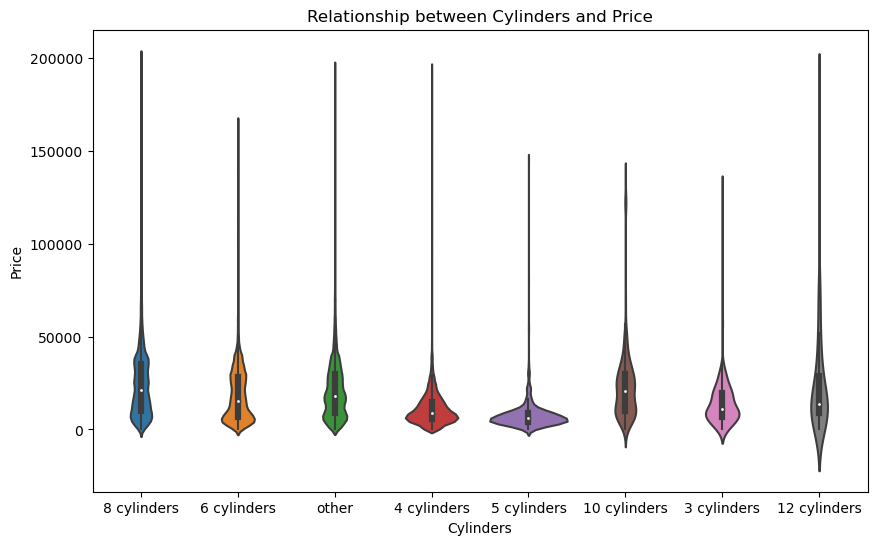

In [85]:
# Visualize the relationship between price and cylinders
plt.figure(figsize=(10, 6))
sns.violinplot(x='cylinders', y='price', data=df_prepared)
plt.title('Relationship between Cylinders and Price')
plt.xlabel('Cylinders')
plt.ylabel('Price')
plt.show()

#### Fuel

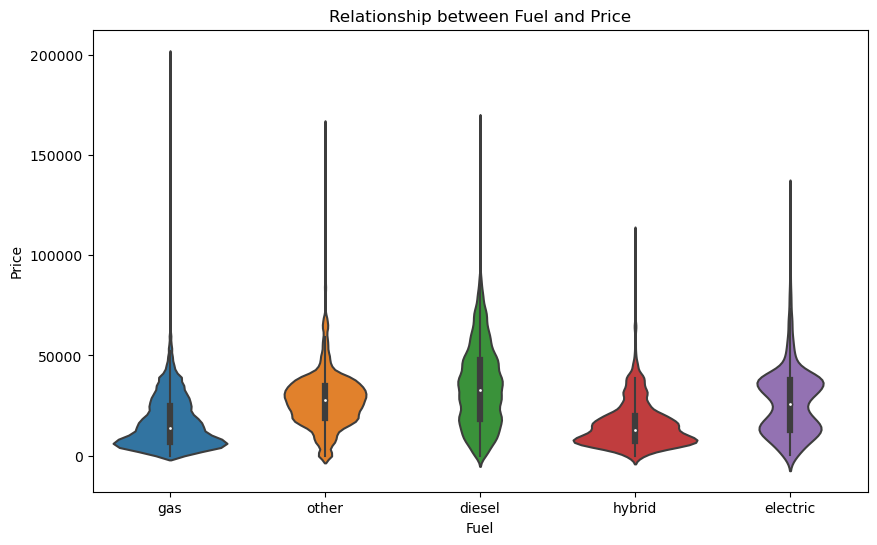

In [86]:
# Visualize the relationship between price and fuel
plt.figure(figsize=(10, 6))
sns.violinplot(x='fuel', y='price', data=df_prepared)
plt.title('Relationship between Fuel and Price')
plt.xlabel('Fuel')
plt.ylabel('Price')
plt.show()

#### Title Status

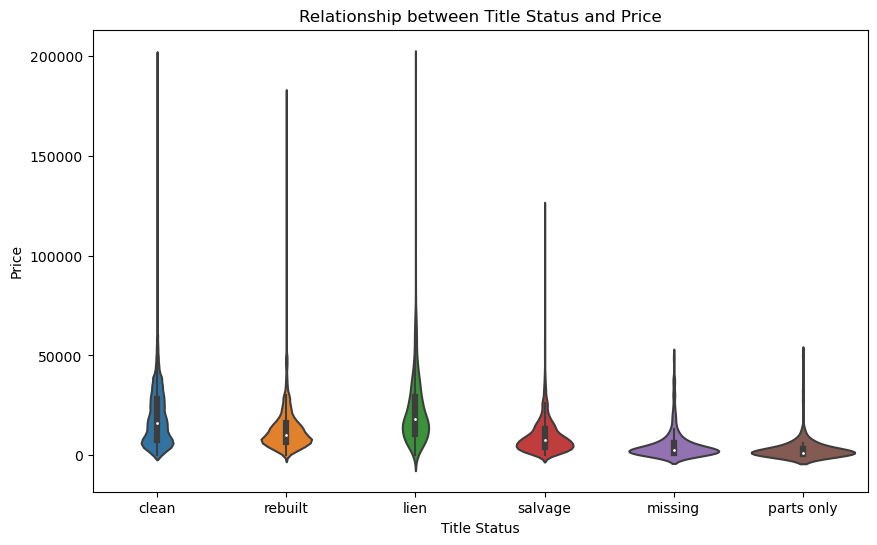

In [87]:
# Visualize the relationship between price and title status
plt.figure(figsize=(10, 6))
sns.violinplot(x='title_status', y='price', data=df_prepared)
plt.title('Relationship between Title Status and Price')
plt.xlabel('Title Status')
plt.ylabel('Price')
plt.show()

#### Transmission

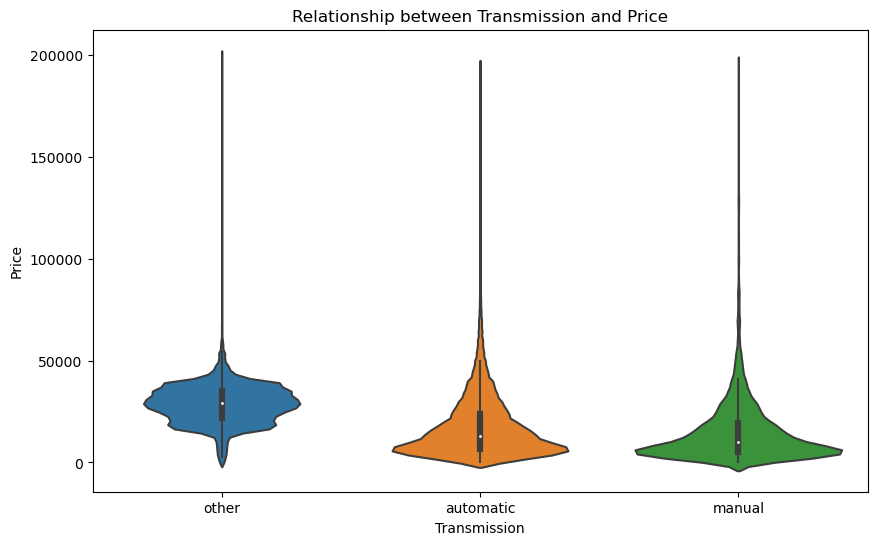

In [88]:
# Visualize the relationship between price and transmission
plt.figure(figsize=(10, 6))
sns.violinplot(x='transmission', y='price', data=df_prepared)
plt.title('Relationship between Transmission and Price')
plt.xlabel('Transmission')
plt.ylabel('Price')
plt.show()

#### Type

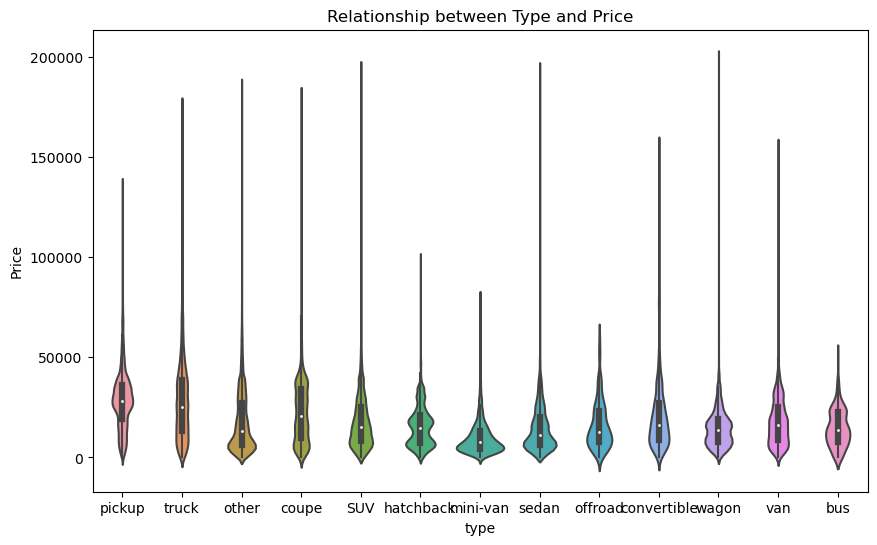

In [89]:
# Visualize the relationship between price and type
plt.figure(figsize=(10, 6))
sns.violinplot(x='type', y='price', data=df_prepared)
plt.title('Relationship between Type and Price')
plt.xlabel('type')
plt.ylabel('Price')
plt.show()

#### State

In [90]:
# Filtering of brands for analysis.
selected_brands = ['chevrolet', 'ford', 'toyota', 'honda', 'jeep','nissan', 'ram','gmc']
df_selected_brands = df_prepared[df_prepared['manufacturer'].isin(selected_brands)]

# Group data by manufacturer and state
mean_price_state_brand = df_selected_brands.groupby(["manufacturer", "state"])[["price"]].mean().reset_index()

# Create a histogram of average prices by state for multiple brands
fig = px.histogram(mean_price_state_brand.sort_values('price', ascending=False), x="state", y="price", color="manufacturer", barmode="group",
                   title="Average Price by State for Selected Brands",
                   labels={"state": "State", "price": "Average Price"})

# Rotate x-axis labels for better readability
fig.update_xaxes(tickangle=-45)

fig.show()

#### Correlation Heatmap
The following graph displays a heatmap with positive correlations greater than 0.1 between all fields and the price. We are selecting only the directly proportional relationships to avoid generating negative prices.

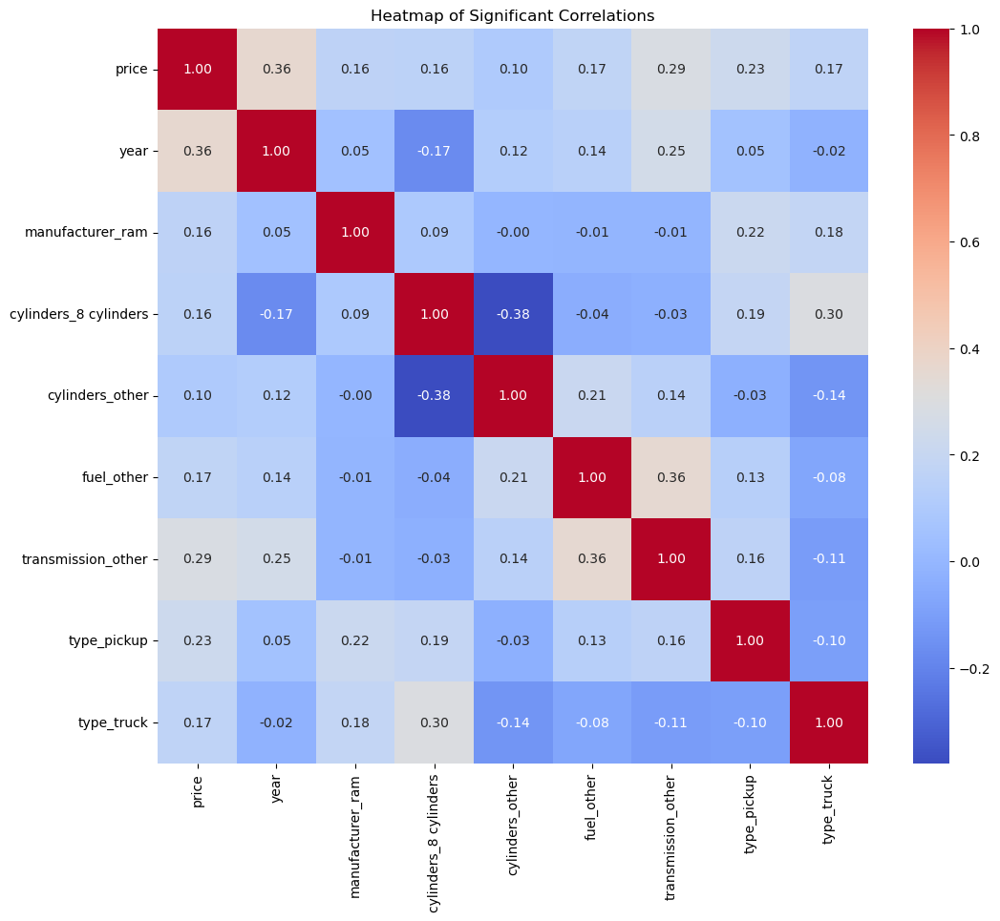

In [91]:
# Calculate the correlation matrix
correlation_matrix = df_prepared.corr()

# Define the threshold for significant correlation
threshold = 0.1

# Filter the columns that have a significant correlation with 'price'
significant_corr_columns = correlation_matrix[correlation_matrix['price'] > threshold]['price'].index

# Obtain the significant correlations
significant_corr_matrix = correlation_matrix.loc[significant_corr_columns, significant_corr_columns]

# Create a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(significant_corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap of Significant Correlations")
plt.show()


### Step 9: Reconstructing the data according to the findings

In [92]:
# List of categorical columns to encode
categorical_cols = ['transmission','type','manufacturer','fuel','cylinders']

features_data = pd.DataFrame(df_scaled[categorical_cols])

# Encode categorical variables using one-hot encoding
features_data_encoded = pd.get_dummies(features_data, columns=categorical_cols, drop_first=True)
features_data_encoded = features_data_encoded[['transmission_other','type_pickup','type_truck','manufacturer_ram','fuel_other',
                                               'cylinders_8 cylinders', 'cylinders_other']]

# Concatenate the dummies table with model data
df_encoded_no_num =pd.concat([df_scaled[['price','year']], features_data_encoded], axis = 1)

# Concatenate the dummies table full data set
df_encoded =pd.concat([df_scaled, features_data_encoded], axis = 1)

df_encoded_no_num['price'] = df_encoded_no_num['price'].astype('int64')
df_prepared_no_num = df_encoded_no_num.query('price < 200000 and price > 10')

### Step 10: Creating Feature Set and Target Variable

In [93]:
# Create feature set (X) and target variable (y)
X = df_prepared_no_num.drop('price', axis = 1)
y = df_prepared_no_num['price']

### Step 11: Splitting the Dataset into Training and Testing

In [94]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 4. Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

### Step 1: Create LASSO model for different degrees.
- **Step 1.1: Range of degrees to test**

In [95]:
# Degrees to consider, there's only one due to the computing power of the personal PC.
# But here, we can change the number of degrees we want to compute and compare for the current model.
degrees_lasso = [1,2,3,4]

- **Step 1.2: Create LASSO**

First, we determine with which degree our LASSO model yields better results; for this purpose, we use 5-fold cross-validation.

In [96]:
# List to store cross-validation scores
cv_scores = []

# Iterate through different polynomial degrees
for degree in degrees_lasso:
    print("Modeling "+str(degree))
    
    # Create a pipeline workflow with Lasso for feature selection and linear regression
    pipe_lasso = Pipeline([('poly_features', PolynomialFeatures(degree = degree, include_bias = False)),
                                ('scaler', StandardScaler()),
                                ('selector', SelectFromModel(Lasso())),
                                ('linreg', LinearRegression())
                    ])
    
    # Calculate cross-validation scores using neg_mean_squared_error as the metric
    scores = -cross_val_score(pipe_lasso, X_train, y_train, scoring='neg_mean_squared_error', cv=5)
    
    # Calculate and store the average of cross-validation scores
    cv_scores.append(np.mean(scores))

# Find the best polynomial degree based on the lowest cross-validation score
best_lasso_degree = degrees_lasso[np.argmin(cv_scores)]

# Print the best polynomial degree
print(f"Best degree: {best_lasso_degree}")

Modeling 1
Modeling 2
Modeling 3
Modeling 4
Best degree: 4


- **Step 1.3: Generate model**

In [97]:
# Create a pipeline for Lasso regression using the best polynomial degree found
pipe_lasso = Pipeline([('poly_features', PolynomialFeatures(degree = best_lasso_degree, include_bias = False)),
                                ('scaler', StandardScaler()),
                                ('selector', SelectFromModel(Lasso())),
                                    ('linreg', LinearRegression())])

- **Step 1.4: Train it**

In [98]:
# Fit the Lasso regression pipeline to the training data
pipe_lasso.fit(X_train,y_train)

Pipeline(steps=[('poly_features',
                 PolynomialFeatures(degree=4, include_bias=False)),
                ('scaler', StandardScaler()),
                ('selector', SelectFromModel(estimator=Lasso())),
                ('linreg', LinearRegression())])

### Step 2: Create Ridge model for different degrees and Alphas.

- **Step 2.1: Range of degrees to test**

In [99]:
# Degrees to consider, there's only one due to the computing power of the personal PC.
# But here, we can change the number of degrees we want to compute and compare for the current model.
degrees_ridge = [1,2,3,4]

- **Step 2.2: Create Ridge**

We determine with which degree our Ridge model yields better results; for this purpose, we use 5-fold cross-validation.

In [100]:
# List to store cross-validation scores
cv_scores = []

# Iterate through different polynomial degrees
for degree in degrees_ridge:
    print("Modeling "+str(degree))
    
    # Create a pipeline for Ridge regression with polynomial feature transformation and scaling
    pipe_ridge = Pipeline([('poly_features', PolynomialFeatures(degree = degree, include_bias = False)),
                     ('scale', StandardScaler()),
                     ('ridge', Ridge())
                    ])
    
    # Calculate cross-validation scores using neg_mean_squared_error as the metric
    scores = -cross_val_score(pipe_ridge, X_train, y_train, scoring='neg_mean_squared_error', cv=5)
    
    # Calculate and store the average of cross-validation scores
    cv_scores.append(np.mean(scores))

# Find the best polynomial degree based on the lowest cross-validation score
best_ridge_degree = degrees_ridge[np.argmin(cv_scores)]

# Print the best polynomial degree
print(f"Best degree: {best_ridge_degree}")

Modeling 1
Modeling 2
Modeling 3
Modeling 4
Best degree: 4


- **Step 2.3: Generate model**

In [101]:
# Create a pipeline for Ridge regression using the best polynomial degree found
pipe_ridge = Pipeline([('poly_features', PolynomialFeatures(degree = best_ridge_degree, include_bias = False)),
                     ('scale', StandardScaler()),
                     ('ridge', Ridge())
                    ])

- **Step 2.4: Find best alpha and train it**

In [102]:
# Define a dictionary of hyperparameters for Ridge regression
param_dict = {'ridge__alpha': [27.5, 27.6, 27.7]}

In [103]:
# Create a GridSearchCV instance using the Ridge regression pipeline and the defined parameter grid
grid = GridSearchCV(pipe_ridge, param_grid=param_dict)

# Fit the GridSearchCV instance to the training data
grid.fit(X_train, y_train)

# Get the best hyperparameters from the grid search results
model_2_best_alpha = grid.best_params_

# Print the best alpha value
print(f'Best Alpha: {list(model_2_best_alpha.values())[0]}')

Best Alpha: 27.6


# 5. Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

### Step 1: Performance of our LASSSO model using MSE.

In [104]:
# Calculate mean squared error for training and testing data using the Lasso pipeline
pipe_lasso_train_mse = mean_squared_error(y_train, pipe_lasso.predict(X_train))
pipe_lasso_test_mse = mean_squared_error(y_test, pipe_lasso.predict(X_test))

# Print the mean squared error for training and testing
print(f'LASSO Train MSE: {pipe_lasso_train_mse}')
print(f'LASSO Test MSE: {pipe_lasso_test_mse}')

LASSO Train MSE: 96675082.99331202
LASSO Test MSE: 98148992.69489467


### Step 2: Performance of our Ridge model using MSE.

In [105]:
# Calculate mean squared error for training and testing data using the Ridge grid search results
model_ridge_train_mse = mean_squared_error(y_train,grid.predict(X_train))
model_ridge_test_mse = mean_squared_error(y_test,grid.predict(X_test))

# Print the mean squared error for training and testing using Ridge model
print(f'Ridge Train MSE: {model_ridge_train_mse}')
print(f'Ridge Test MSE: {model_ridge_test_mse}')

Ridge Train MSE: 96652402.12688752
Ridge Test MSE: 98163337.45489246


### Step 3: Chose the best model.
According to our analysis, we can observe that in both the training and, more importantly, the testing data, the LASSO model exhibits slightly better performance in terms of Mean Squared Error (MSE)

### Step 4: Ploting the best model vs real data.

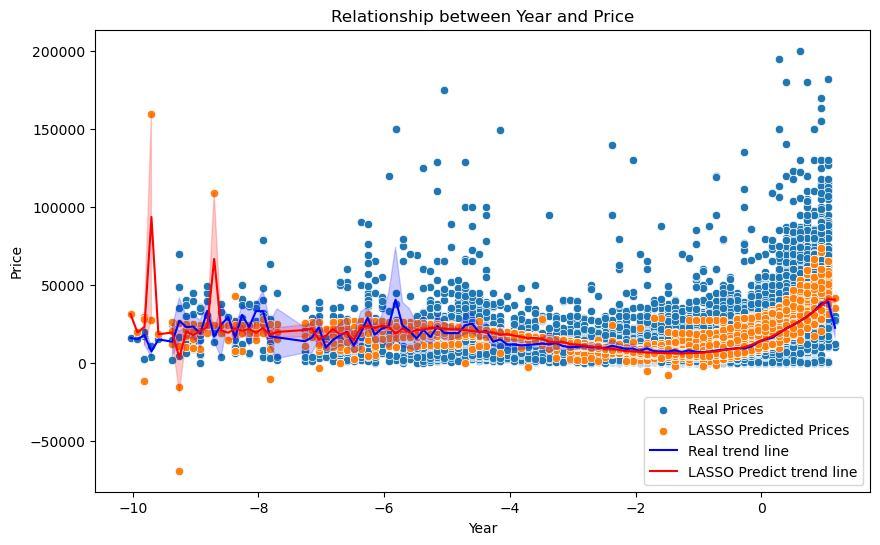

In [106]:
# Visualize the relationship between LASSO Model and Real Price with Test data and a Year vs Price Plot
plot_test_pred = X_test.copy()
plot_test_real = X_test.copy()
plot_test_pred['price_pred'] = pipe_lasso.predict(X_test)
plot_test_real['price_real'] = y_test

plt.figure(figsize=(10, 6))
sns.scatterplot(x='year', y='price_real', data=plot_test_real, label='Real Prices')
sns.scatterplot(x='year', y='price_pred', data=plot_test_pred, label='LASSO Predicted Prices')
sns.lineplot(x='year', y='price_real', data=plot_test_real, color='blue', label='Real trend line')
sns.lineplot(x='year', y='price_pred', data=plot_test_pred, color='red', label='LASSO Predict trend line')
plt.title('Relationship between Year and Price')
plt.xlabel('Year')
plt.ylabel('Price')
plt.legend()
plt.show()

# 7. Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

# Used Car Price Analysis Report
## Executive Summary
In this report, we present the results of our analysis of used car prices. Our objective was to identify key factors influencing used car prices and provide recommendations for optimizing dealership inventory.
## Methodology
Description of analysis stages performed, from data cleaning and transformation to creation and evaluation of regression models.
## Findings
1. **Relevant Factors:** We identified several factors significantly correlated with used car prices, including the car's year, brand, transmission type, body type, and fuel type. The features that positively affect price increase the most are:
    - The features that positively affect price increase the most are:
    - If the car has a transmission type other than automatic and manual.
    - If it's of type Pickup or Truck.
    - If the manufacturer is RAM.
    - If the fuel method is different from gas, diesel, hybrid, or electric.
    - Finally, if it has 8 cylinders or others different from 6, 4, 5, 10, 3, and 12.
2. **Predictive Model:** We developed regression models that accurately predict used car prices based on these factors.
3. **Missing data:** There is a significant amount of missing data in the provided dataset. With an approximate of aroun 14.79% of the total data.
4. **State Correlation:** There's an interesting dependency of the average car price based on the state of origin, which in turn depends on the brand. A clear example is Washington and Utah, where for many manufacturers, the average price tends to be higher.
## Recommendations
1. **Inventory Optimization:** Using our predictive model, dealerships can more accurately estimate appropriate prices for cars in their inventory.
2. **Focus on Key Features:** Special attention is advised for features with higher influence on prices, such as car year and brand.
3. **Ongoing Monitoring:** As new data becomes available, periodic updates and refinements of the model are recommended to maintain accuracy and relevance.
## Conclusions
Our analysis provides valuable insights for used car dealerships aiming to optimize operations and enhance decision-making in inventory management.
## Next Steps
1. **Model Implementation:** Collaborate with the technical team to implement the predictive model within dealership environments.
2. **Monitoring and Updates:** Establish a continuous monitoring process to assess model accuracy and update as needed.
3. **Further Exploration:** Continue exploring other variables and features that may impact prices and evaluate their inclusion in the model.
## Contact Information
For further details and assistance, please don't hesitate to reach out to our team at suarezlondonjuandiego@protonmail.com.